# **1. Initial Configuration**

## **Go to Edit -> Notebook settings -> Mark GPU square -> Save**


## 2. Installation (just hit run)

Install cellpose -- by default the torch GPU version is installed in COLAB notebook.

Note that cellpose uses the latest version of numpy, so please click the "Restart runtime" button once the install completes.

In [ ]:
!pip install "opencv-python-headless<4.3"
!pip install cellpose

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 MB 12.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 1.3.1 requires opencv-python-headless>=4.1.1, but you have opencv-python-headless 3.4.18.65 which is incompatible.
qudida 0.0.4 requires opencv-python-headless>=4.0.1, but you have opencv-python-headless 3.4.18.65 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 205.0/205.0 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 55.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.6/39.6 MB 16.5 MB/s eta 0:00:00
  Using cached nvidia_cud

Check CUDA version and GPU

In [ ]:
!nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
/bin/bash: line 1: nvidia-smi: command not found


import libraries and check GPU (the first time you import cellpose the models will download).

In [ ]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

from urllib.parse import urlparse
from cellpose import models, core
import os
from scipy import ndimage

use_GPU = core.use_gpu()
print('>>> GPU activated? %d'%use_GPU)

# call logger_setup to have output of cellpose written
from cellpose.io import logger_setup
logger_setup();


>>> GPU activated? 0
creating new log file


## 3. Connect with Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 4. Enter the path to your image folder

In [ ]:
drive_path = "/content/drive/MyDrive/Fotos células/"  # Replace with your folder path

## 5. Generate images (press Play)

In [ ]:
urls = []

# List all files and directories in the folder
for item in os.listdir(drive_path):
    if item == "masks":
      continue
    # Get the full path
    full_path = os.path.join(drive_path, item)
    urls.append(full_path)

images = [skimage.io.imread(url) for url in urls]

from cellpose import models

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type='cyto')
channels = [0,0]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended)
# diameter can be a list or a single number for all images

masks, flows, styles, diams = model.eval(images, diameter=None, flow_threshold=None, channels=channels)

100%|██████████| 25.3M/25.3M [00:00<00:00, 97.6MB/s]
100%|██████████| 5.23k/5.23k [00:00<00:00, 9.89MB/s]


In [ ]:
from PIL import Image

min_size = 1500

for idx, mask in enumerate(masks):
    masks[idx] = np.where(mask == 0, 0, 1)

    # Label connected components in the mask
    labeled_mask, num_features = ndimage.label(mask)

    # Calculate the size of each connected component
    component_sizes = np.bincount(labeled_mask.flatten())[1:]

    # Identify components below the minimum size threshold
    small_components = np.where(component_sizes < min_size)[0] + 1

    # Remove small components from the mask
    for small_component in small_components:
        masks[idx][labeled_mask == small_component] = 0

folder_path = drive_path + "masks/"
# Create the folder
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

for idx, mask in enumerate(masks):

    # Convert the binary array to an image
    binary_image_array = (mask.astype(np.uint8) * 255)
    image = Image.fromarray(binary_image_array)

    # Save the image
    output_path = f'{folder_path}{urls[idx].split("/")[-1].split(".")[0]}_mask.png'
    image.save(output_path)

import time
time.sleep(60)

## 6. View results

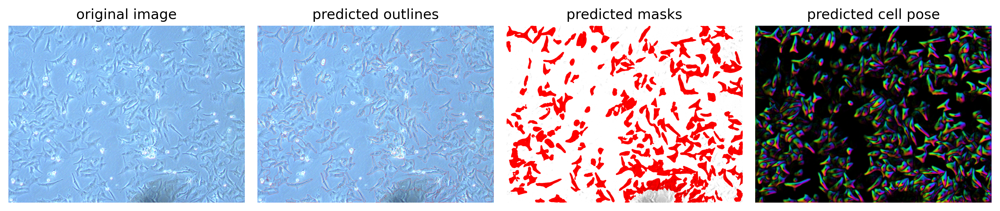

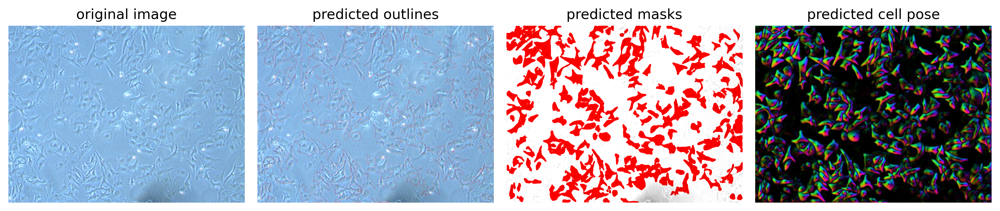

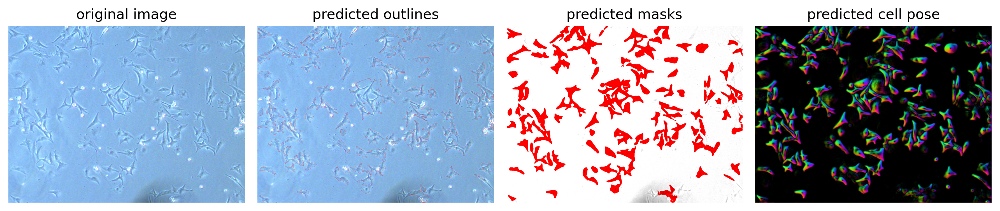

In [ ]:
# DISPLAY RESULTS
from cellpose import plot

nimg = len(images)
for idx in range(nimg):
    maski = masks[idx]
    flowi = flows[idx][0]

    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, images[idx], maski, flowi, channels=channels)
    plt.tight_layout()
    plt.show()